# Mount Google Drive
from google.colab import drive
drive.mount('/content/drive')

import zipfile

# Unzip the downloaded file
with zipfile.ZipFile("/content/drive/MyDrive/XAI/SkinCancer.zip", 'r') as zip_ref:
    zip_ref.extractall("extracted_folder")

# List contents
import os
os.listdir("extracted_folder")

#  Using Fuzzy U-Net Architecture - Segmenting Skin Cancer Images

## 1. Importing required libraries

In [1]:
import os
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

import glob as gb
import tensorflow as tf

from sklearn.model_selection import train_test_split

from tensorflow.keras import layers, Model
from tensorflow.keras.layers import Input, Conv2D, MaxPooling2D, BatchNormalization, Conv2DTranspose, Activation, add

from tensorflow.keras.optimizers import Adam
from tensorflow.keras.losses import BinaryCrossentropy
from tensorflow.keras.metrics import Precision, Recall, MeanSquaredError

from tensorflow.keras import backend as K

sns.set_theme(style='darkgrid', palette='pastel')

## 2. Checking the dataset if there are enough masks corresponding to the images

In [13]:
# images and masks folder paths
image_dir = 'images'
mask_dir = 'masks'

# list of images and masks from the directory
image_files = sorted([f for f in os.listdir(image_dir) if f.endswith('.jpg')])
mask_files = sorted([f for f in os.listdir(mask_dir) if f.endswith('.png')])

# generating lis of image names (without extension) & masks names (without 'segmentation' suffix & extension)
image_names = [os.path.splitext(f)[0] for f in image_files]
mask_names = [os.path.splitext(f)[0].replace('_segmentation', '') for f in mask_files]

# checking if all the images have corresponding masks or not
missing_masks = [img for img in image_names if img not in mask_names]

if len(missing_masks) == 0:
    print('All images have corresponding masks...')
else:
    print(f'No of images that dont have corresponding masks: {len(missing_images)}')

All images have corresponding masks...


## 3. Displaying the images and their corresponding masks

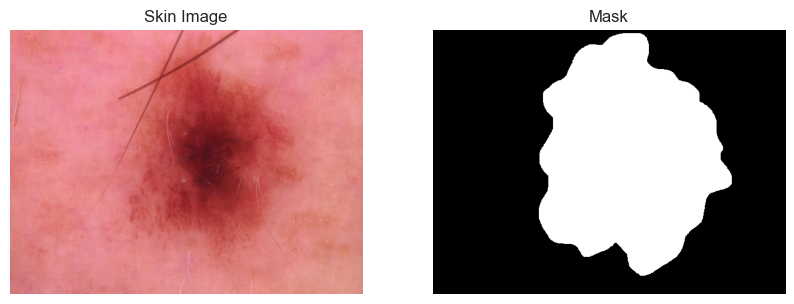

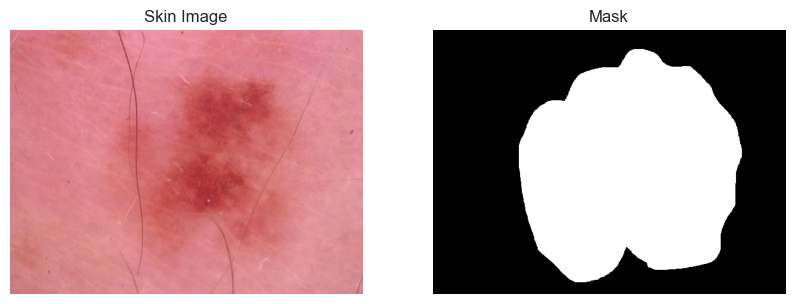

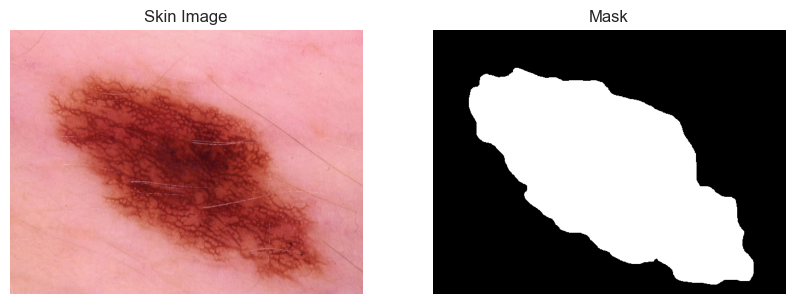

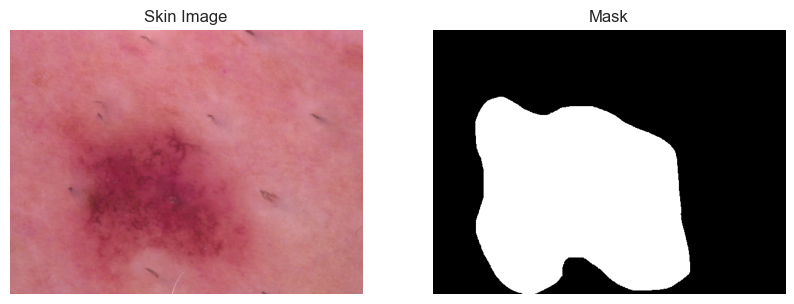

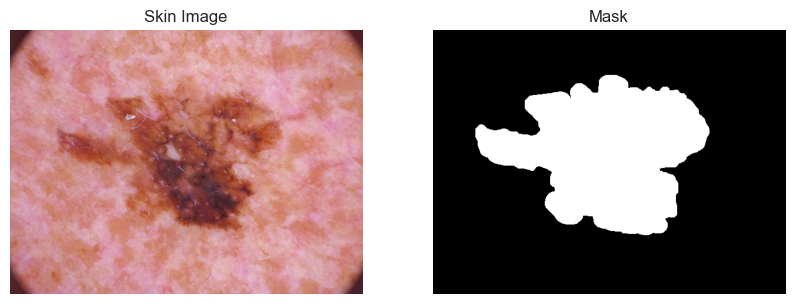

In [14]:
import matplotlib.pyplot as plt
from PIL import Image

# function to display image & mask
def display_function(image_path, mask_path):
    image = Image.open(image_path)
    mask = Image.open(mask_path)

    # side by side display
    fig, axis = plt.subplots(1, 2, figsize=(10, 5))
    axis[0].imshow(image)
    axis[0].set_title('Skin Image')
    axis[0].axis('off')

    axis[1].imshow(mask, cmap='gray')
    axis[1].set_title('Mask')
    axis[1].axis('off')

    plt.show()


# Displaying 5 images & masks
for i in range(5):
    image_path = os.path.join(image_dir, image_files[i])

    mask_name = os.path.splitext(image_files[i])[0] + '_segmentation.png'
    mask_path = os.path.join(mask_dir, mask_name)

    display_function(image_path, mask_path)

## 4. Displaying masked images

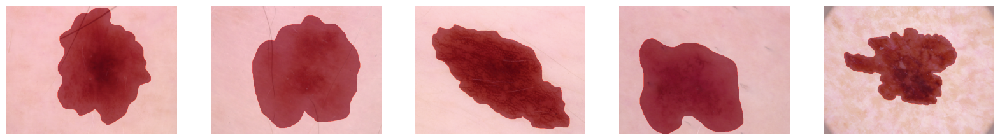

In [15]:
# function to display masked images
def display_masked_images(image_path, mask_path):
    image = Image.open(image_path)
    mask = Image.open(mask_path)

    # converting image & mask to numpy array
    image_np = np.array(image)
    mask_np = np.array(mask)

    return image_np, mask_np

# displaying 5 masked images
fig, axis = plt.subplots(1, 5, figsize=(20,5))

for i in range(5):
    image_path = os.path.join(image_dir, image_files[i])

    mask_name = os.path.splitext(image_files[i])[0] + '_segmentation.png'
    mask_path = os.path.join(mask_dir, mask_name)

    image_np, mask_np = display_masked_images(image_path, mask_path)

    # display masked images
    axis[i].imshow(image_np)
    axis[i].imshow(mask_np, cmap='Reds', alpha=0.5) # alpha - to make it semi transparent
    axis[i].axis('off')

plt.show()

## 5. Preparing data

In [16]:
# setting the default values
IMG_SIZE = 256
BATCH_SIZE = 32
BUFFER_SIZE = 1000

AUTOTUNE = tf.data.experimental.AUTOTUNE

IMG_DIR = 'images'
MASK_DIR = 'masks'

In [17]:
# function to get image path and masks
def image_mask_paths(image_dir, mask_dir):
    images_path = sorted(gb.glob(os.path.join(image_dir, '*.jpg')))
    masks_path = sorted(gb.glob(os.path.join(mask_dir, '*.png')))

    images_path = np.array(images_path)
    masks_path = np.array(masks_path)

    return images_path, masks_path

images_path, masks_path = image_mask_paths(IMG_DIR, MASK_DIR)

In [18]:
print("Number of images:", len(images_path))
print("Number of masks:", len(masks_path))

Number of images: 10015
Number of masks: 10015


## 6. Dividing dataset into training & validation set

In [19]:
X_train, X_temp, y_train, y_temp = train_test_split(images_path, masks_path, train_size=0.8, random_state=42)
X_val, X_test, y_val, y_test = train_test_split(X_temp, y_temp, train_size=0.5, random_state=42)

print(f'Training Samples: {len(X_train)}')
print(f'Validation Samples: {len(X_val)}')
print(f'Testing Samples: {len(X_test)}')

Training Samples: 8012
Validation Samples: 1001
Testing Samples: 1002


In [20]:
# function to loading & preprocessing data

def mapping_function(image_path, mask_path):
    img = tf.io.read_file(image_path)
    img = tf.image.decode_jpeg(img, channels=3)
    img = tf.image.resize(img, (IMG_SIZE, IMG_SIZE))
    img = tf.cast(img, tf.float32)/255.0

    mask = tf.io.read_file(mask_path)
    mask = tf.image.decode_jpeg(mask, channels=1)
    mask = tf.image.resize(mask, (IMG_SIZE, IMG_SIZE))
    mask = tf.cast(mask, tf.float32) / 255.0

    return img, mask

# creating training set
train_set = tf.data.Dataset.from_tensor_slices((X_train, y_train))
train_set = train_set.map(mapping_function, num_parallel_calls=AUTOTUNE)
train_set = train_set.shuffle(BUFFER_SIZE).batch(BATCH_SIZE).prefetch(buffer_size=AUTOTUNE)

# creating validation set
validation_set = tf.data.Dataset.from_tensor_slices((X_val, y_val))
validation_set = validation_set.map(mapping_function, num_parallel_calls=AUTOTUNE)
validation_set = validation_set.shuffle(BUFFER_SIZE).batch(BATCH_SIZE).prefetch(buffer_size=AUTOTUNE)

# creating testing set
test_set = tf.data.Dataset.from_tensor_slices((X_test, y_test))
test_set = test_set.map(mapping_function, num_parallel_calls=AUTOTUNE)
test_set = test_set.shuffle(BUFFER_SIZE).batch(BATCH_SIZE).prefetch(buffer_size=AUTOTUNE)

In [21]:
print(f'Length of Training Set: {len(train_set)}')
print(f'Length of Validation Set: {len(validation_set)}')
print(f'Length of Testing Set: {len(test_set)}')

Length of Training Set: 251
Length of Validation Set: 32
Length of Testing Set: 32


## 7. Fuzzy U-Net model implementation

In [22]:
def fuzzy_unet(input_shape=(IMG_SIZE, IMG_SIZE, 3)):
    inputs = Input(shape=input_shape)

    x = Conv2D(32, 3, padding="same")(inputs)
    x = BatchNormalization()(x)
    x = Activation("relu")(x)

    skip_connections = []

    # Encoder
    for filters in [64, 128, 256, 512]:
        x = Conv2D(filters, 3, padding='same')(x)
        x = BatchNormalization()(x)
        x = Activation("relu")(x)

        x = Conv2D(filters, 3, padding='same')(x)
        x = BatchNormalization()(x)
        x = Activation("relu")(x)

        skip_connections.append(x)
        x = MaxPooling2D(2, padding="same")(x)

    # Bottleneck with fuzzy membership calculations
    x = Conv2D(1024, 3, padding='same')(x)
    x = BatchNormalization()(x)
    x = Activation("relu")(x)
    x = Conv2D(1024, 3, padding='same')(x)
    x = BatchNormalization()(x)
    x = Activation("relu")(x)

    # Decoder with fuzzy skip connections
    for filters in [512, 256, 128, 64]:
        x = Conv2DTranspose(filters, 2, strides=2, padding="same")(x)

        # Fuzzy attention for skip connections
        skip_connection = skip_connections.pop()
        attention = Conv2D(filters, 1, padding='same', activation='sigmoid')(skip_connection)
        skip_connection = skip_connection * attention  # Fuzzy weighting
        x = add([x, skip_connection])

        x = Conv2D(filters, 3, padding='same')(x)
        x = BatchNormalization()(x)
        x = Activation("relu")(x)

        x = Conv2D(filters, 3, padding='same')(x)
        x = BatchNormalization()(x)
        x = Activation("relu")(x)

    outputs = Conv2D(1, 1, activation="sigmoid")(x)

    model = Model(inputs, outputs)
    return model

# Instantiate the fuzzy U-Net model
model = fuzzy_unet(input_shape=(IMG_SIZE, IMG_SIZE, 3))
# model.summary()

## 8. Loss Functions

In [23]:
# Dice Coefficient
def dice_coefficient(y_true, y_pred, smooth=1):
    intersection = tf.reduce_sum(y_true * y_pred, axis=[1, 2, 3])
    union = tf.reduce_sum(y_true, axis=[1, 2, 3]) + tf.reduce_sum(y_pred, axis=[1, 2, 3])
    dice = (2 * intersection + smooth) / (union + smooth)
    return tf.reduce_mean(dice, axis=0)

# Dice Loss
def dice_coef_loss(y_true, y_pred):
    return 1 - dice_coefficient(y_true, y_pred)

# IoU Metric
def iou(y_true, y_pred, smooth=1):
    intersection = tf.reduce_sum(y_true * y_pred, axis=[1, 2, 3])
    union = tf.reduce_sum(y_true, axis=[1, 2, 3]) + tf.reduce_sum(y_pred, axis=[1, 2, 3]) - intersection
    iou_score = (intersection + smooth) / (union + smooth)
    return tf.reduce_mean(iou_score, axis=0)

## 9. Model Compilation

In [24]:
model.compile(
    optimizer=Adam(learning_rate=0.0002),
    loss=BinaryCrossentropy(),
    metrics=[
        'binary_accuracy',
        Precision(name='precision'),
        Recall(name='recall'),
        dice_coefficient,
        iou,
        MeanSquaredError(name='mse')
    ]
)

## 10. Model Basic Structure

In [ ]:
# # Code for plotting the model

# from keras.utils import plot_model
# plot_model(model, to_file='model_plot.png', show_shapes=True, show_layer_names=True)

## 11. Model Summary

In [25]:
model.summary()

Model: "functional"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ input_layer         │ (None, 256, 256,  │          0 │ -                 │
│ (InputLayer)        │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d (Conv2D)     │ (None, 256, 256,  │        896 │ input_layer[0][0] │
│                     │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalization │ (None, 256, 256,  │        128 │ conv2d[0][0]      │
│ (BatchNormalizatio… │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ activation          │ (None, 256, 256,  │          0 │ batch_normalizat… │
│ (Activation)        │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_1 (Conv2D)   │ (None, 256, 256,  │     18,496 │ activation[0][0]  │
│                     │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 256, 256,  │        256 │ conv2d_1[0][0]    │
│ (BatchNormalizatio… │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ activation_1        │ (None, 256, 256,  │          0 │ batch_normalizat… │
│ (Activation)        │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_2 (Conv2D)   │ (None, 256, 256,  │     36,928 │ activation_1[0][… │
│                     │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 256, 256,  │        256 │ conv2d_2[0][0]    │
│ (BatchNormalizatio… │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ activation_2        │ (None, 256, 256,  │          0 │ batch_normalizat… │
│ (Activation)        │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling2d       │ (None, 128, 128,  │          0 │ activation_2[0][… │
│ (MaxPooling2D)      │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_3 (Conv2D)   │ (None, 128, 128,  │     73,856 │ max_pooling2d[0]… │
│                     │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 128, 128,  │        512 │ conv2d_3[0][0]    │
│ (BatchNormalizatio… │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ activation_3        │ (None, 128, 128,  │          0 │ batch_normalizat… │
│ (Activation)        │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_4 (Conv2D)   │ (None, 128, 128,  │    147,584 │ activation_3[0][… │
│                     │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 128, 128,  │        512 │ conv2d_4[0][0]    │
│ (BatchNormalizatio… │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ activation_4        │ (None, 128, 128,  │          0 │ batch_normalizat

 Total params: 28,288,705 (107.91 MB)

 Trainable params: 28,276,865 (107.87 MB)

 Non-trainable params: 11,840 (46.25 KB)

## 12. Model Training

In [ ]:
from tensorflow.keras.callbacks import ModelCheckpoint

# Define the callback
checkpoint_callback = ModelCheckpoint(
    filepath='model_epoch_{epoch:02d}.keras',  # Use .keras instead of .h5
    save_weights_only=False,                  # Save the entire model (architecture + weights)
    save_best_only=True,                      # Save only the best model based on the monitored metric
    monitor='val_loss',                       # Metric to monitor for saving the model
    verbose=1                                 # Print saving status
)

# Train the model with the callback
history = model.fit(
    train_set,
    epochs=10,
    validation_data=validation_set,
    callbacks=[checkpoint_callback]           # Add the callback here
)


Epoch 1/10
251/251 ━━━━━━━━━━━━━━━━━━━━ 0s 2s/step - binary_accuracy: 0.8604 - dice_coefficient: 0.6051 - iou: 0.4660 - loss: 0.3321 - mse: 0.0992 - precision: 0.7590 - recall: 0.7777
Epoch 1: val_loss improved from inf to 0.21382, saving model to model_epoch_01.keras
251/251 ━━━━━━━━━━━━━━━━━━━━ 587s 2s/step - binary_accuracy: 0.8605 - dice_coefficient: 0.6054 - iou: 0.4663 - loss: 0.3318 - mse: 0.0991 - precision: 0.7593 - recall: 0.7778 - val_binary_accuracy: 0.9180 - val_dice_coefficient: 0.7045 - val_iou: 0.5683 - val_loss: 0.2138 - val_mse: 0.0592 - val_precision: 0.8634 - val_recall: 0.8370
Epoch 2/10
251/251 ━━━━━━━━━━━━━━━━━━━━ 0s 2s/step - binary_accuracy: 0.9406 - dice_coefficient: 0.7736 - iou: 0.6545 - loss: 0.1573 - mse: 0.0424 - precision: 0.9133 - recall: 0.8681
Epoch 2: val_loss improved from 0.21382 to 0.16998, saving model to model_epoch_02.keras
251/251 ━━━━━━━━━━━━━━━━━━━━ 409s 2s/step - binary_accuracy: 0.9406 - dice_coefficient: 0.7737 - iou: 0.6546 - loss: 0.157

In [ ]:
model.save("Skin_cancer_Segmentation.keras")


## 13. Plotting the results graphs

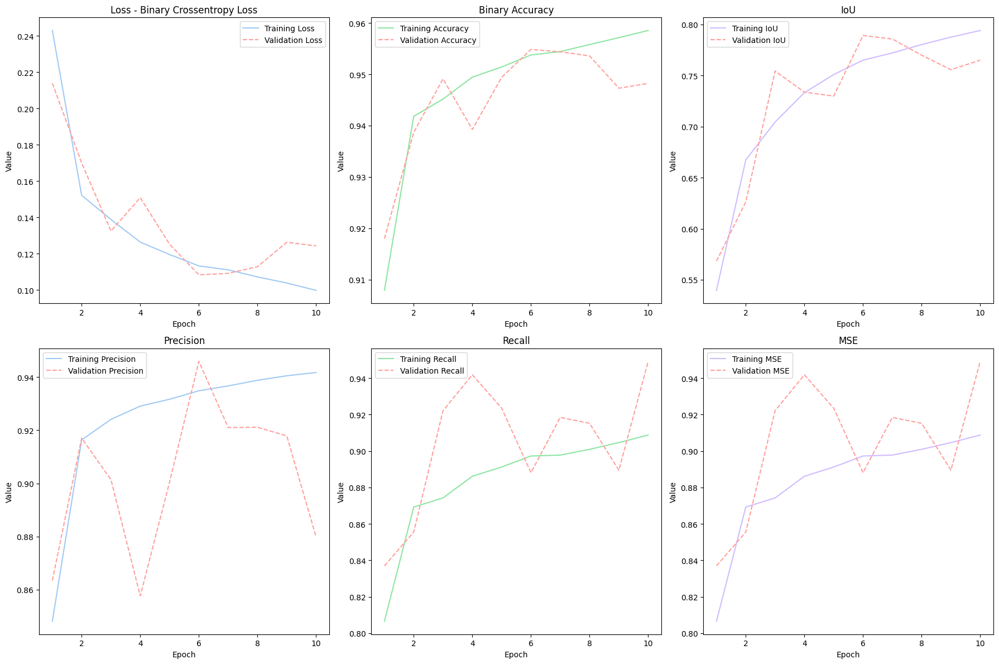

In [ ]:
# Function to plot training and validation metrics
def plot_training_metrics(history):
    """
    Plots training and validation metrics for loss, accuracy, IoU, precision, and recall.
    """
    epochs = range(1, len(history.history['loss']) + 1)

    plt.style.use('default')

    # Create a figure for all plots
    plt.figure(figsize=(18, 12))

    # Plot Loss
    plt.subplot(2, 3, 1)
    plt.plot(epochs, history.history['loss'], 'b-', label='Training Loss')
    plt.plot(epochs, history.history['val_loss'], 'r--', label='Validation Loss')
    plt.title('Loss - Binary Crossentropy Loss')
    plt.xlabel('Epoch')
    plt.ylabel('Value')
    plt.legend()

    # Plot Accuracy
    plt.subplot(2, 3, 2)
    plt.plot(epochs, history.history['binary_accuracy'], 'g-', label='Training Accuracy')
    plt.plot(epochs, history.history['val_binary_accuracy'], 'r--', label='Validation Accuracy')
    plt.title('Binary Accuracy')
    plt.xlabel('Epoch')
    plt.ylabel('Value')
    plt.legend()

    # Plot IoU
    plt.subplot(2, 3, 3)
    if 'iou' in history.history:
        plt.plot(epochs, history.history['iou'], 'm-', label='Training IoU')
        plt.plot(epochs, history.history['val_iou'], 'r--', label='Validation IoU')
        plt.title('IoU')
        plt.xlabel('Epoch')
        plt.ylabel('Value')
        plt.legend()
    else:
        plt.title('IoU Not Found in History')

    # Plot Precision
    plt.subplot(2, 3, 4)
    if 'precision' in history.history:
        plt.plot(epochs, history.history['precision'], 'b-', label='Training Precision')
        plt.plot(epochs, history.history['val_precision'], 'r--', label='Validation Precision')
        plt.title('Precision')
        plt.xlabel('Epoch')
        plt.ylabel('Value')
        plt.legend()
    else:
        plt.title('Precision Not Found in History')

    # Plot Recall
    plt.subplot(2, 3, 5)
    if 'recall' in history.history:
        plt.plot(epochs, history.history['recall'], 'g-', label='Training Recall')
        plt.plot(epochs, history.history['val_recall'], 'r--', label='Validation Recall')
        plt.title('Recall')
        plt.xlabel('Epoch')
        plt.ylabel('Value')
        plt.legend()
    else:
        plt.title('Recall Not Found in History')


    # Plot MSE
    plt.subplot(2, 3, 6)
    if 'mse' in history.history:
        plt.plot(epochs, history.history['recall'], 'm-', label='Training MSE')
        plt.plot(epochs, history.history['val_recall'], 'r--', label='Validation MSE')
        plt.title('MSE')
        plt.xlabel('Epoch')
        plt.ylabel('Value')
        plt.legend()
    else:
        plt.title('MSE Not Found in History')

    # Adjust layout for better display
    plt.tight_layout()
    plt.show()

# Example usage
plot_training_metrics(history)

## 14. Model Evaluation using testing dataset

In [ ]:
test_loss, test_accuracy, test_precision, test_recall, test_dice, test_iou, test_mse = model.evaluate(test_set)

print(f"Test Loss: {test_loss:.4f}")
print(f"Test Accuracy: {test_accuracy:.4f}")
print(f"Test Precision: {test_precision:.4f}")
print(f"Test Recall: {test_recall:.4f}")
print(f"Test Dice Coefficient: {test_dice:.4f}")
print(f"Test IOU: {test_iou:.4f}")
print(f"Test Mean Squared Error: {test_mse:.4f}")

32/32 ━━━━━━━━━━━━━━━━━━━━ 39s 958ms/step - binary_accuracy: 0.9443 - dice_coefficient: 0.8534 - iou: 0.7621 - loss: 0.1359 - mse: 0.0388 - precision: 0.8782 - recall: 0.9490
Test Loss: 0.1368
Test Accuracy: 0.9436
Test Precision: 0.8760
Test Recall: 0.9442
Test Dice Coefficient: 0.8464
Test IOU: 0.7533
Test Mean Squared Error: 0.0393


## 15. Displaying Testing Images, Ground Truth Masks & Predicted Masks

In [26]:
def calculating_dice(y_true, y_pred, smooth=1):
    # converting tensors to numpy array (only for y_true)
    y_true_f = y_true.numpy().flatten()
    y_pred_f = y_pred.flatten()

    intersection = np.sum(y_true_f * y_pred_f)

    dice = (2. * intersection + smooth) / (np.sum(y_true_f) + np.sum(y_pred_f) + smooth)

    return dice

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


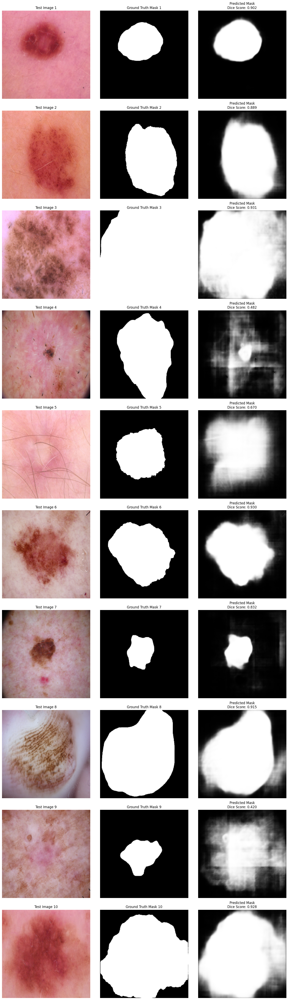

In [ ]:
# taking the 1st 10 images for prediction
num_images = 10
test_images, test_masks = next(iter(test_set)) # getting batch images from the generator

# predicting the 1st 10 images
predicted_masks = model.predict(test_images[:num_images])

# displaying the 10 images
plt.figure(figsize=(15, 5 * num_images))

for i in range(num_images):
    dice_score = calculating_dice(test_masks[i], predicted_masks[i])

    # displaying original image
    plt.subplot(num_images, 3, 3*i+1)
    plt.imshow(test_images[i].numpy())
    plt.title(f'Test Image {i+1}')
    plt.axis('off')

    # displaying the ground truth mask
    plt.subplot(num_images, 3, 3*i+2)
    plt.imshow(test_masks[i].numpy().squeeze(), cmap='gray')
    plt.title(f'Ground Truth Mask {i+1}')
    plt.axis('off')

    # displaying the predicted mask
    plt.subplot(num_images, 3, 3*i+3)
    plt.imshow(predicted_masks[i].squeeze(), cmap='gray')
    plt.title(f"Predicted Mask\nDice Score: {dice_score:.3f}")
    plt.axis('off')

plt.tight_layout()
plt.show()

## 16. Saving the model

model.save("Skin_cancer_Segmentation.h5")

# 17. Loading back trained model

In [1]:
from tensorflow.keras.models import load_model

model = load_model("Skin_cancer_Segmentation.keras", custom_objects={"dice_coefficient": dice_coefficient, "iou": iou})


KeyboardInterrupt: 

In [34]:
for layer in model.layers:
    print(layer.name)


input_layer
conv2d
batch_normalization
activation
conv2d_1
batch_normalization_1
activation_1
conv2d_2
batch_normalization_2
activation_2
max_pooling2d
conv2d_3
batch_normalization_3
activation_3
conv2d_4
batch_normalization_4
activation_4
max_pooling2d_1
conv2d_5
batch_normalization_5
activation_5
conv2d_6
batch_normalization_6
activation_6
max_pooling2d_2
conv2d_7
batch_normalization_7
activation_7
conv2d_8
batch_normalization_8
activation_8
max_pooling2d_3
conv2d_9
batch_normalization_9
activation_9
conv2d_10
batch_normalization_10
activation_10
conv2d_11
conv2d_transpose
add
conv2d_12
batch_normalization_11
activation_11
conv2d_13
batch_normalization_12
activation_12
conv2d_14
conv2d_transpose_1
add_1
conv2d_15
batch_normalization_13
activation_13
conv2d_16
batch_normalization_14
activation_14
conv2d_17
conv2d_transpose_2
add_2
conv2d_18
batch_normalization_15
activation_15
conv2d_19
batch_normalization_16
activation_16
conv2d_20
conv2d_transpose_3
add_3
conv2d_21
batch_normalizati

In [35]:
last_conv_layer_name = "conv2d_23"  # Replace with the actual name


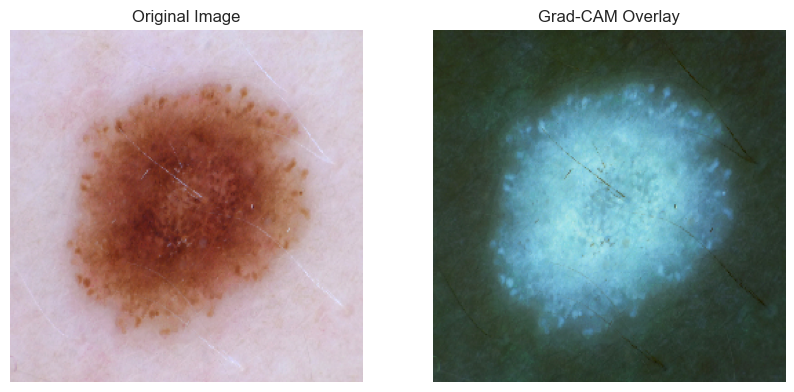

In [46]:
import tensorflow as tf
import numpy as np
import matplotlib.pyplot as plt
from tensorflow.keras.models import load_model
from tensorflow.keras import Model

def load_trained_model(path):
    """
    Load the trained Keras model.
    """
    return load_model(path)


def make_gradcam_heatmap(model, img, last_conv_layer_name, target_class=None):
    """
    Generate a Grad-CAM heatmap for a segmentation model.

    Args:
        model: Trained segmentation model.
        img: Input image (preprocessed).
        last_conv_layer_name: Name of the last convolutional layer in the model.
        target_class: Target class for which to compute Grad-CAM. Default is the first class.

    Returns:
        A heatmap highlighting regions important for the prediction.
    """
    # Get the last convolutional layer
    last_conv_layer = model.get_layer(last_conv_layer_name)

    # Create a model that maps the input image to the activations of the last conv layer
    # and the model's output
    grad_model = Model(
        [model.inputs],
        [last_conv_layer.output, model.output]
    )

    # Compute the gradient of the target class wrt the output feature map
    with tf.GradientTape() as tape:
        conv_outputs, predictions = grad_model(img)

        # If target_class is None, default to the first class
        if target_class is None:
            target_class = 0

        # For segmentation, focus on the target class across all pixels
        class_channel = predictions[..., target_class]

    # Get the gradients of the class wrt the feature map
    grads = tape.gradient(class_channel, conv_outputs)

    # Compute the mean intensity of the gradients along the channel axis
    pooled_grads = tf.reduce_mean(grads, axis=(0, 1, 2))

    # Multiply each channel in the feature map by its corresponding gradient intensity
    conv_outputs = conv_outputs[0]
    heatmap = conv_outputs @ pooled_grads[..., tf.newaxis]
    heatmap = tf.squeeze(heatmap)

    # Normalize the heatmap
    heatmap = tf.maximum(heatmap, 0) / tf.math.reduce_max(heatmap)
    return heatmap.numpy()


def overlay_heatmap(heatmap, img, alpha=0.4, colormap="viridis"):
    """
    Overlay the Grad-CAM heatmap on the original image.

    Args:
        heatmap: Grad-CAM heatmap.
        img: Original input image (non-preprocessed, for visualization).
        alpha: Transparency factor for the overlay.
        colormap: Matplotlib colormap.

    Returns:
        The image with the heatmap overlay.
    """
    # Rescale heatmap to 0-255
    heatmap = np.uint8(255 * heatmap)

    # Apply colormap
    cmap = plt.get_cmap(colormap)
    colored_heatmap = cmap(heatmap)
    colored_heatmap = np.delete(colored_heatmap, 3, 2)  # Remove alpha channel

    # Resize heatmap to match the image size
    heatmap = tf.image.resize(colored_heatmap, (img.shape[0], img.shape[1])).numpy()

    # Superimpose heatmap on the image
    superimposed_img = heatmap * alpha + img
    superimposed_img = np.clip(superimposed_img, 0, 255).astype("uint8")
    return superimposed_img



# Example usage:
if __name__ == "__main__":
    # Load model
    model = load_model("Skin_cancer_Segmentation.keras", custom_objects={"dice_coefficient": dice_coefficient, "iou": iou})

    # Load and preprocess a sample image
    img_path = "sample_image.jpg"
    original_img = tf.keras.utils.load_img("images\ISIC_0024317.jpg", target_size=(256, 256))
    img_array = tf.keras.utils.img_to_array(original_img)
    img_array = (img_array * 255).astype("uint8")
    img_preprocessed = tf.expand_dims(img_array / 255.0, axis=0)  # Normalize and add batch dim

    # Generate Grad-CAM heatmap
    last_conv_layer_name = "conv2d_23"  # Replace with your model's last conv layer name
    heatmap = make_gradcam_heatmap(model, img_preprocessed, last_conv_layer_name)

    # Overlay heatmap on original image
    superimposed_img = overlay_heatmap(heatmap, img_array, alpha=0.8, colormap="hot")

    # Display the image
    plt.figure(figsize=(10, 5))
    plt.subplot(1, 2, 1)
    plt.imshow(original_img)
    plt.title("Original Image")
    plt.axis("off")

    plt.subplot(1, 2, 2)
    plt.imshow(superimposed_img)
    plt.title("Grad-CAM Overlay")
    plt.axis("off")
    plt.show()


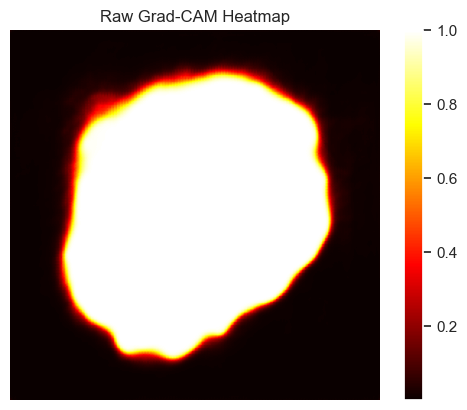

In [44]:
plt.imshow(heatmap, cmap="hot")
plt.title("Raw Grad-CAM Heatmap")
plt.colorbar()
plt.axis("off")
plt.show()


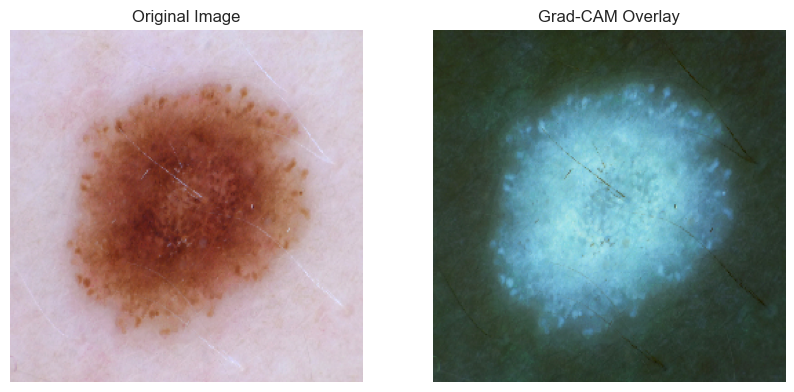

In [47]:
# Example usage:
if __name__ == "__main__":
    # Load model
    model = load_model("Skin_cancer_Segmentation.keras", custom_objects={"dice_coefficient": dice_coefficient, "iou": iou})

    # Load and preprocess a sample image
    img_path = "sample_image.jpg"
    original_img = tf.keras.utils.load_img("images\ISIC_0024317.jpg", target_size=(256, 256))
    img_array = tf.keras.utils.img_to_array(original_img)
    img_array = (img_array * 255).astype("uint8")
    img_preprocessed = tf.expand_dims(img_array / 255.0, axis=0)  # Normalize and add batch dim

    # Generate Grad-CAM heatmap
    last_conv_layer_name = "conv2d_6"  # Replace with your model's last conv layer name
    heatmap = make_gradcam_heatmap(model, img_preprocessed, last_conv_layer_name)

    # Overlay heatmap on original image
    superimposed_img = overlay_heatmap(heatmap, img_array, alpha=0.8, colormap="hot")

    # Display the image
    plt.figure(figsize=(10, 5))
    plt.subplot(1, 2, 1)
    plt.imshow(original_img)
    plt.title("Original Image")
    plt.axis("off")

    plt.subplot(1, 2, 2)
    plt.imshow(superimposed_img)
    plt.title("Grad-CAM Overlay")
    plt.axis("off")
    plt.show()


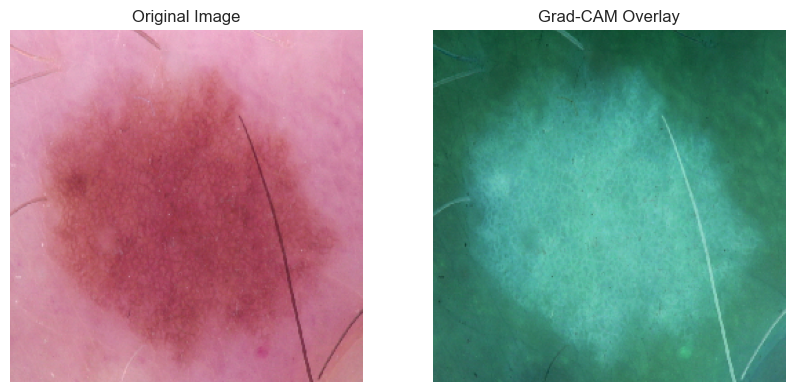

In [49]:
# Example usage:
if __name__ == "__main__":
    # Load model
    model = load_model("Skin_cancer_Segmentation.keras", custom_objects={"dice_coefficient": dice_coefficient, "iou": iou})

    # Load and preprocess a sample image
    img_path = "sample_image.jpg"
    original_img = tf.keras.utils.load_img("images\ISIC_0024474.jpg", target_size=(256, 256))
    img_array = tf.keras.utils.img_to_array(original_img)
    img_array = (img_array * 255).astype("uint8")
    img_preprocessed = tf.expand_dims(img_array / 255.0, axis=0)  # Normalize and add batch dim

    # Generate Grad-CAM heatmap
    last_conv_layer_name = "conv2d_23"  # Replace with your model's last conv layer name
    heatmap = make_gradcam_heatmap(model, img_preprocessed, last_conv_layer_name)

    # Overlay heatmap on original image
    superimposed_img = overlay_heatmap(heatmap, img_array, alpha=0.8, colormap="viridis")

    # Display the image
    plt.figure(figsize=(10, 5))
    plt.subplot(1, 2, 1)
    plt.imshow(original_img)
    plt.title("Original Image")
    plt.axis("off")

    plt.subplot(1, 2, 2)
    plt.imshow(superimposed_img)
    plt.title("Grad-CAM Overlay")
    plt.axis("off")
    plt.show()


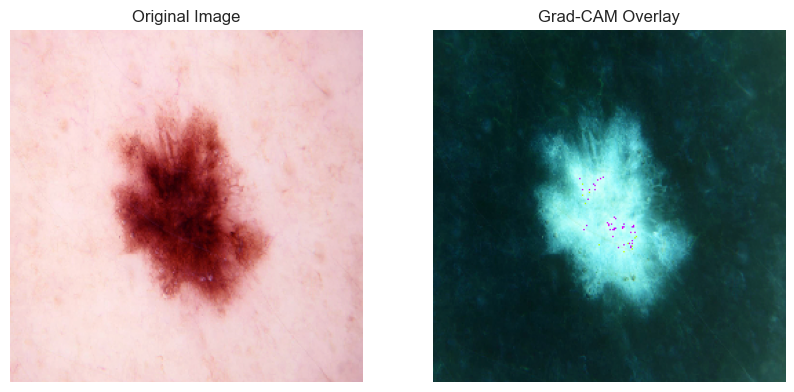

In [50]:
# Example usage:
if __name__ == "__main__":
    # Load model
    model = load_model("Skin_cancer_Segmentation.keras", custom_objects={"dice_coefficient": dice_coefficient, "iou": iou})

    # Load and preprocess a sample image
    img_path = "sample_image.jpg"
    original_img = tf.keras.utils.load_img("images\ISIC_0024596.jpg", target_size=(256, 256))
    img_array = tf.keras.utils.img_to_array(original_img)
    img_array = (img_array * 255).astype("uint8")
    img_preprocessed = tf.expand_dims(img_array / 255.0, axis=0)  # Normalize and add batch dim

    # Generate Grad-CAM heatmap
    last_conv_layer_name = "conv2d_23"  # Replace with your model's last conv layer name
    heatmap = make_gradcam_heatmap(model, img_preprocessed, last_conv_layer_name)

    # Overlay heatmap on original image
    superimposed_img = overlay_heatmap(heatmap, img_array, alpha=0.8, colormap="hot")

    # Display the image
    plt.figure(figsize=(10, 5))
    plt.subplot(1, 2, 1)
    plt.imshow(original_img)
    plt.title("Original Image")
    plt.axis("off")

    plt.subplot(1, 2, 2)
    plt.imshow(superimposed_img)
    plt.title("Grad-CAM Overlay")
    plt.axis("off")
    plt.show()


# Occlusion sensitivity

In [56]:
import numpy as np
import matplotlib.pyplot as plt
import tensorflow as tf
from tensorflow.keras.models import load_model

def occlusion_sensitivity(model, input_img, mask_size, stride, target_class=None):
    """
    Perform occlusion sensitivity analysis for a segmentation model.

    Args:
        model: Trained segmentation model.
        input_img: Input image (preprocessed) with shape (H, W, C).
        mask_size: Size of the occlusion mask (e.g., 16 for a 16x16 patch).
        stride: Stride of the sliding window.
        target_class: Target class for analysis. Default is the first class (0 for binary segmentation).

    Returns:
        A sensitivity map showing the impact of occlusion on the model's output.
    """
    img_height, img_width, img_channels = input_img.shape
    sensitivity_map = np.zeros((img_height, img_width))

    # Normalize the input image
    input_img = input_img / 255.0  # Ensure the image is normalized to [0, 1]
    input_img = np.expand_dims(input_img, axis=0)  # Add batch dimension

    # Iterate over the image with a sliding window
    for y in range(0, img_height, stride):
        for x in range(0, img_width, stride):
            # Create a copy of the image
            occluded_img = input_img.copy()

            # Apply the occlusion mask
            occluded_img[0, y:y + mask_size, x:x + mask_size, :] = 0  # Set patch to black

            # Predict with the occluded image
            prediction = model.predict(occluded_img, verbose=0)

            # For segmentation, focus on the target class across the entire output
            if target_class is None:
                target_class = 0  # Default to first class for binary segmentation

            # Calculate the reduction in confidence for the target class
            sensitivity_map[y:y + mask_size, x:x + mask_size] += np.sum(prediction[0, ..., target_class])

    # Normalize the sensitivity map to [0, 1]
    sensitivity_map = sensitivity_map / np.max(sensitivity_map)
    return sensitivity_map


def visualize_occlusion_sensitivity(original_img, sensitivity_map):
    """
    Visualize the occlusion sensitivity map on the original image.

    Args:
        original_img: Original input image (non-preprocessed, for visualization).
        sensitivity_map: Occlusion sensitivity map.
    """
    # Resize the sensitivity map to match the original image dimensions
    sensitivity_map_resized = tf.image.resize(sensitivity_map[..., tf.newaxis], 
                                              (original_img.shape[0], original_img.shape[1])).numpy()
    sensitivity_map_resized = np.squeeze(sensitivity_map_resized)

    # Plot the original image and sensitivity map
    plt.figure(figsize=(10, 5))

    # Original image
    plt.subplot(1, 2, 1)
    plt.imshow(original_img.astype("uint8"))
    plt.title("Original Image")
    plt.axis("off")

    # Sensitivity map overlay
    plt.subplot(1, 2, 2)
    plt.imshow(original_img.astype("uint8"))
    plt.imshow(sensitivity_map_resized, cmap="jet", alpha=0.7)
    plt.title("Occlusion Sensitivity")
    plt.axis("off")

    plt.show()

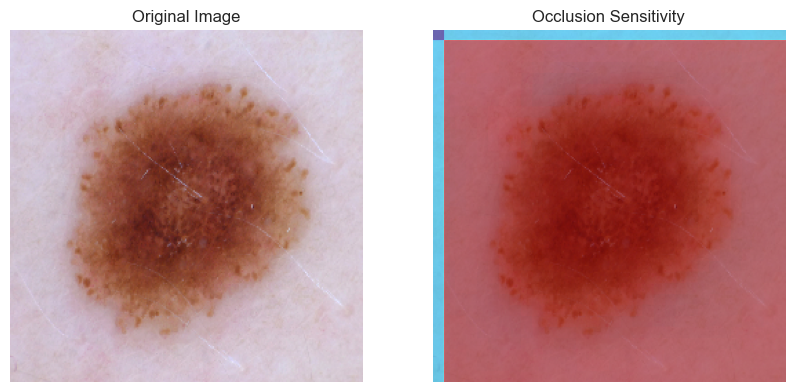

In [ ]:

# Example Usage
if __name__ == "__main__":
    # Load the trained segmentation model
    model = load_model("Skin_cancer_Segmentation.keras", custom_objects={"dice_coefficient": dice_coefficient, "iou": iou})

    # Load and preprocess a sample image
    img_path = "images/ISIC_0024317.jpg"
    original_img = tf.keras.utils.load_img(img_path, target_size=(256, 256))  # Resize to match model input
    img_array = tf.keras.utils.img_to_array(original_img)

    # Perform occlusion sensitivity analysis
    mask_size = 16  # Size of the occlusion mask
    stride = 8  # Stride for sliding the occlusion mask
    sensitivity_map = occlusion_sensitivity(model, img_array, mask_size, stride, target_class=0)

    # Visualize the sensitivity map
    visualize_occlusion_sensitivity(img_array, sensitivity_map)


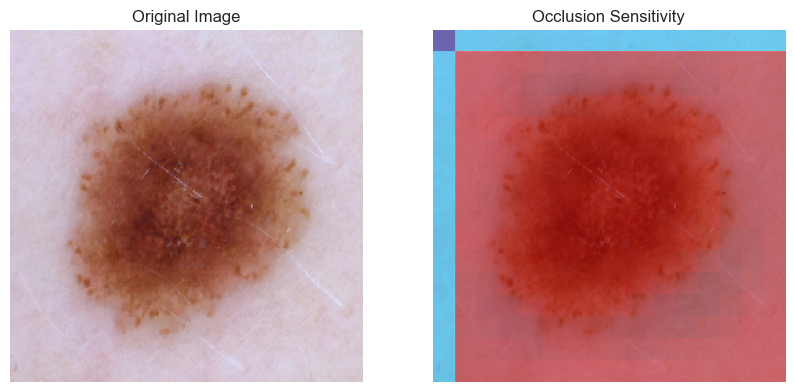

In [53]:

# Example Usage
if __name__ == "__main__":
    # Load the trained segmentation model
    model = load_model("Skin_cancer_Segmentation.keras", custom_objects={"dice_coefficient": dice_coefficient, "iou": iou})

    # Load and preprocess a sample image
    img_path = "images/ISIC_0024317.jpg"
    original_img = tf.keras.utils.load_img(img_path, target_size=(256, 256))  # Resize to match model input
    img_array = tf.keras.utils.img_to_array(original_img)

    # Perform occlusion sensitivity analysis
    mask_size = 32  # Size of the occlusion mask
    stride = 16  # Stride for sliding the occlusion mask
    sensitivity_map = occlusion_sensitivity(model, img_array, mask_size, stride, target_class=0)
    #sensitivity_map /= np.max(sensitivity_map)
    # Visualize the sensitivity map
    visualize_occlusion_sensitivity(img_array, sensitivity_map)



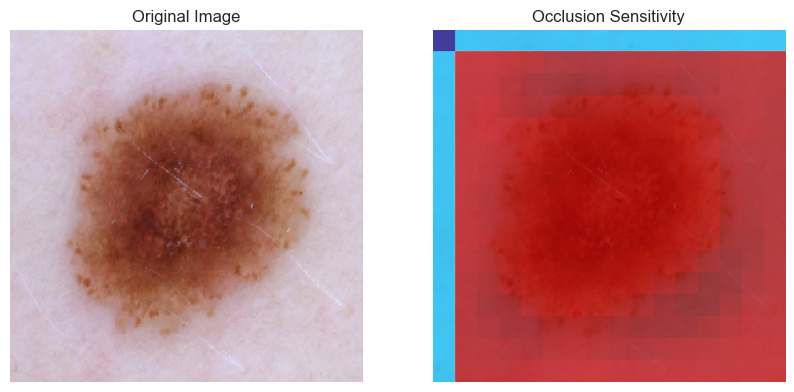

In [57]:

# Example Usage
if __name__ == "__main__":
    # Load the trained segmentation model
    model = load_model("Skin_cancer_Segmentation.keras", custom_objects={"dice_coefficient": dice_coefficient, "iou": iou})

    # Load and preprocess a sample image
    img_path = "images/ISIC_0024317.jpg"
    original_img = tf.keras.utils.load_img(img_path, target_size=(256, 256))  # Resize to match model input
    img_array = tf.keras.utils.img_to_array(original_img)

    # Perform occlusion sensitivity analysis
    mask_size = 32  # Size of the occlusion mask
    stride = 16  # Stride for sliding the occlusion mask
    sensitivity_map = occlusion_sensitivity(model, img_array, mask_size, stride, target_class=0)
    #sensitivity_map /= np.max(sensitivity_map)
    # Visualize the sensitivity map
    visualize_occlusion_sensitivity(img_array, sensitivity_map)